In [1]:
#from marching_cubes import march
import numpy as np
#from seaborn import kdeplot
import matplotlib.pyplot as plt
%matplotlib inline

import plotly
import plotly.graph_objs as go

import fresnel

from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Draw

from scipy.spatial.distance import cdist

#from skimage import measure

In [2]:
mol = Chem.MolFromSmiles('CCCCCC1=CC(=C2C3C=C(CCC3C(OC2=C1)(C)C)C)O')
mol = Chem.AddHs(mol)
AllChem.EmbedMolecule(mol)
conf = mol.GetConformer()
positions = np.array([list(conf.GetAtomPosition(int(i))) for i in range(mol.GetNumAtoms())])
positions = (positions - np.mean(positions,0)) + 10
radii = np.array([Chem.GetPeriodicTable().GetRvdw(a.GetAtomicNum()) for a in mol.GetAtoms()])
radii = radii-0.2

In [3]:

Chem.rdmolfiles.MolToPDBFile(mol, 'hi.pdb')

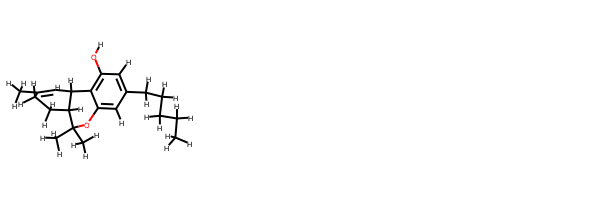

In [4]:
Draw.MolsToGridImage([mol])

# Trying delaunay first:

In [5]:
def golden_spiral(num_pts, radius):
    if radius==0:
        return np.array([[0,0,0]])
    indices = np.arange(0, num_pts, dtype=float) + 0.5
    phi = np.arccos(1 - 2*indices/num_pts)
    theta = np.pi * (1 + 5**0.5) * indices
    x, y, z = np.cos(theta) * np.sin(phi), np.sin(theta) * np.sin(phi), np.cos(phi);
    points = np.vstack([x,y,z]).T
    return points*radius

stamp = golden_spiral(200, 1)
atom_centres = positions.copy()
#surface_points = (stamp + atom_centres[:,None]).reshape(-1,3)
#normals = surface_points.copy()
surface_points = list()
for c, r in zip(atom_centres, radii):
    tempstamp = stamp*r
    surface_points.append(tempstamp+c)
surface_points = np.vstack(surface_points)



distances = cdist(surface_points, atom_centres)
mask = distances.min(1)>=1-0.001
surface_points = surface_points[mask]
#normals = normals[mask]

In [43]:


import meshplex
from scipy.spatial import Delaunay
tetra = Delaunay(atom_centres)
#node_coords = surface_points.copy()
node_coords = atom_centres.copy()
cells = tetra.simplices
mesh = meshplex.MeshTetra(node_coords, cells)
mesh.create_cell_face_relationships()

In [44]:
face_centers = surface_points[mesh.faces['nodes']].mean(1)
facemask = cdist(face_centers, atom_centres).min(1)<1.0

In [54]:
from scipy.spatial.distance import squareform,pdist
triangles = surface_points[mesh.faces['nodes']]
sizemask = np.zeros(triangles.shape[0]).astype(bool)
for i in range(triangles.shape[0]):
    triangle = triangles[i,:,:]
    if squareform(pdist(triangle)).max()<2:#0.565:
        sizemask[i]=True

In [50]:
sum(sizemask)

29

In [59]:
import igl

In [ ]:
lv, lf = igl.loop(surface_points, mesh.faces['nodes'][sizemask])

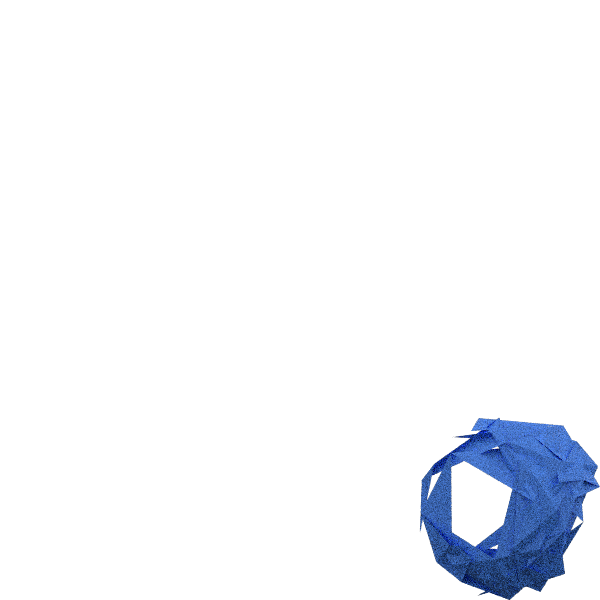

In [55]:
scene1 = fresnel.Scene()
#geom = fresnel.geometry.Mesh(scene1,vertices=lv[lf].reshape(-1,3),N=1)

geom = fresnel.geometry.Mesh(scene1,vertices=surface_points[mesh.faces['nodes'][sizemask]].reshape(-1,3),N=1)
geom.material = fresnel.material.Material(color=fresnel.color.linear([0.25,0.5,0.9]), roughness=0.6)
scene1.camera = fresnel.camera.fit(scene1,view='front', margin=0)
scene1.lights = fresnel.light.cloudy()
fresnel.pathtrace(scene1, samples=20, h=600, w=600)

In [6]:
def make_vol_sample(numpts, radius):
    ranpts = np.random.uniform(0,radius*2,(numpts,3))-radius
    randist = ((ranpts)**2).sum(1)
    ranpts = ranpts[randist<(radius**2)]
    return ranpts

def golden_spiral(num_pts, radius):
    if radius==0:
        return np.array([[0,0,0]])
    indices = np.arange(0, num_pts, dtype=float) + 0.5
    phi = np.arccos(1 - 2*indices/num_pts)
    theta = np.pi * (1 + 5**0.5) * indices
    x, y, z = np.cos(theta) * np.sin(phi), np.sin(theta) * np.sin(phi), np.cos(phi);
    points = np.vstack([x,y,z]).T
    return points*radius

def make_atom_volume(atomradius, grid_spacing):
    radii = np.linspace(0,atomradius, int(atomradius/(grid_spacing/2))*2)
    numpts= (np.pi*4*radii**2 / (grid_spacing**2)).astype(int)
    pts = np.vstack([golden_spiral(numpts[i], radii[i]) for i in range(numpts.shape[0])])
    return pts

def plotly_scatter(pointsets, sizes):
    data = []
    for p, s in zip(pointsets, sizes):
        a,b,c = p[:,0], p[:,1], p[:,2]
        trace = go.Scatter3d(x=a, y=b, z=c, mode='markers', marker={'size': s,'opacity': 0.8,})
        data.append(trace)
    layout = go.Layout(margin={'l': 0, 'r': 0, 'b': 0, 't': 0})
    plot_figure = go.Figure(data=data, layout=layout)
    plotly.offline.iplot(plot_figure)
    
def fresnel_mesh(vol, cutoff, n_samples=10, view=None, spacing=(1,1,1)):
    if view is not None:
        view = view
    else:
        view='front'
    #vert, norm, faces = march(vol, smooth) 
    vert, faces, norm, values= measure.marching_cubes_lewiner(vol, cutoff,spacing=(1,1,1))
    scene1 = fresnel.Scene()
    geom = fresnel.geometry.Mesh(scene1,vertices=vert[faces].reshape(-1,3),N=1)
    geom.material = fresnel.material.Material(color=fresnel.color.linear([0.25,0.5,0.9]), roughness=0.6)
    scene1.camera = fresnel.camera.fit(scene1,view=view, margin=0)
    scene1.lights = fresnel.light.cloudy()
    return fresnel.pathtrace(scene1, samples=n_samples, h=600, w=600)

In [224]:
##Set all the useful values:

#atomradius = 1.7
proberadius = 1.4 #Angstrom.

In [225]:
n_atoms= 55
space = np.max(positions)
atom_centres = np.random.uniform(0,space,(n_atoms,3))
atom_centres = golden_spiral(50,4)

atom_centres = positions.copy()
atom_centres -= np.min(atom_centres,0)



molecule_volume = np.max(atom_centres) #angstroms
grid_spacing = 0.3
buffer = 5 #angstrom
grid_size = int(np.rint(molecule_volume / grid_spacing) + np.rint(2*buffer/grid_spacing))

proberadius = proberadius/grid_spacing
radii = radii/grid_spacing



In [226]:
plotly_scatter([atom_centres],[20])

In [227]:
#create a grid of the correct size:
a,b,c = np.ones([grid_size, grid_size, grid_size]).nonzero()
gPoints = np.vstack([a,b,c]).T
print(gPoints.shape)

(474552, 3)


In [228]:
#Calculate the minimum distance to atom centres (after mapping to grid units)
m =(cdist(gPoints, (atom_centres+buffer)/grid_spacing)-(radii)).min(1)
#subtract radius of probe to get distance to the surface:
m = m-(proberadius)
#set the grid values to their minimum distances to an atom (minus the radii)
grid = np.zeros([grid_size, grid_size,grid_size])
grid[gPoints[:,0], gPoints[:,1], gPoints[:,2]]=m

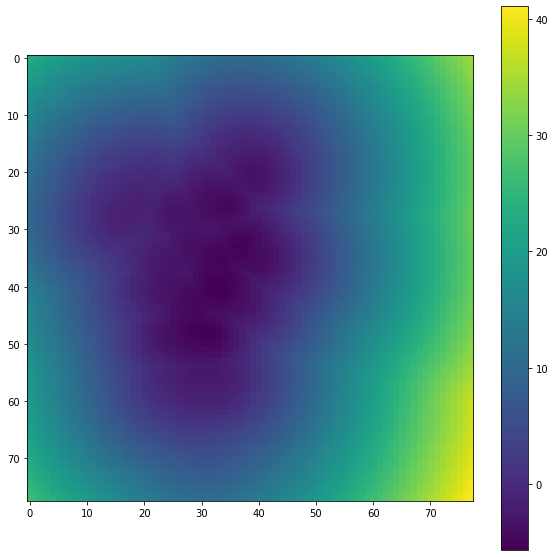

In [229]:

plt.figure(figsize=(10,10))
plt.imshow(grid[:,:,35])
plt.colorbar()

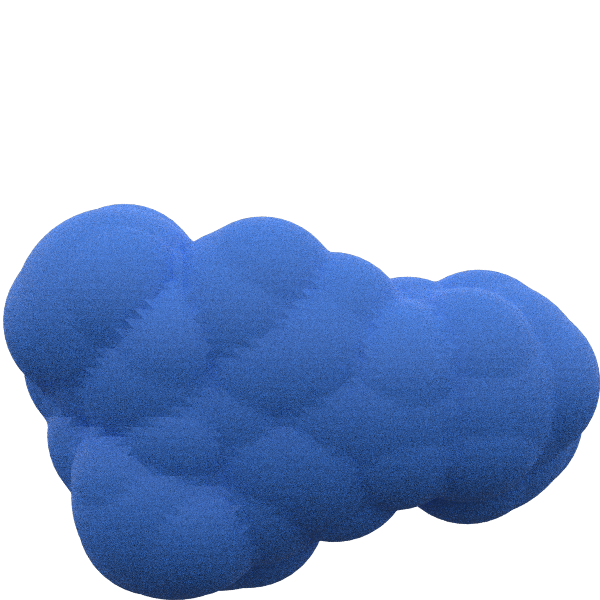

In [230]:
#whole thing is 10A across, and each sphere should be radius 1.4+1.7
fresnel_mesh(grid, 0, n_samples=50,spacing=(0.1,0.,0.,1))


In [231]:
vert, faces, norm, values= measure.marching_cubes_lewiner(grid, 1)
f = open('test.obj', 'w')
for v in vert:
    f.write('v '+str(v[0])+' '+str(v[1])+' '+str(v[2])+'\n')
    
for v in norm:
    f.write('vn '+str(v[0])+' '+str(v[1])+' '+str(v[2])+'\n')
f.close()

In [232]:
from scipy.spatial import cKDTree
voronoi_kdtree = cKDTree(vert,leafsize=5)

In [233]:
vert

array([[ 7.9585915, 35.       , 25.       ],
       [ 8.       , 34.83891  , 25.       ],
       [ 8.       , 35.       , 24.811289 ],
       ...,
       [70.077255 , 33.       , 23.       ],
       [70.117744 , 33.       , 24.       ],
       [70.04231  , 33.       , 25.       ]], dtype=float32)

In [234]:
a,b =voronoi_kdtree.query(gPoints)

In [235]:
emp2 = np.zeros([grid_size, grid_size,grid_size])
emp2[gPoints[:,0], gPoints[:,1], gPoints[:,2]]=a - (proberadius)

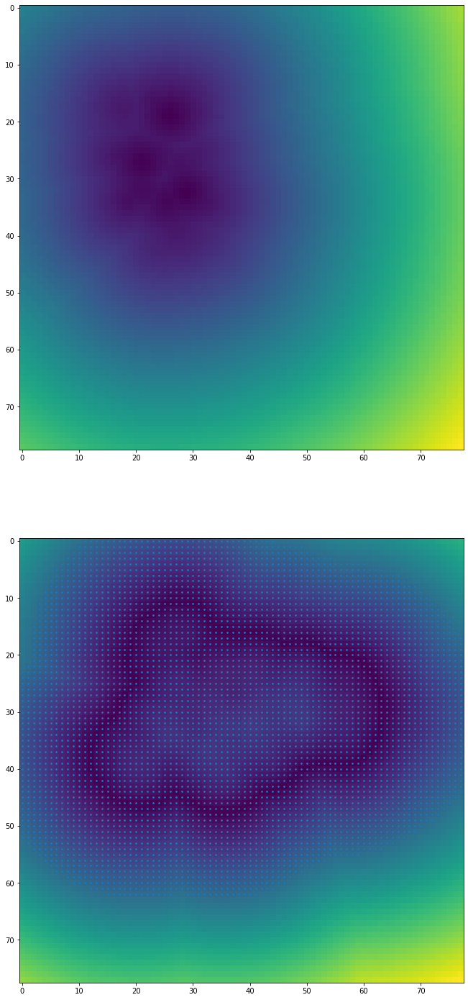

In [236]:
fig, ax = plt.subplots(2,1)
fig.set_figwidth(15)
fig.set_figheight(25)
ax[0].imshow(grid[25])
ax[1].imshow(emp2[:,:,35].T)

ax[1].scatter(*(emp2<10)[:,:,35].nonzero(),s=3)

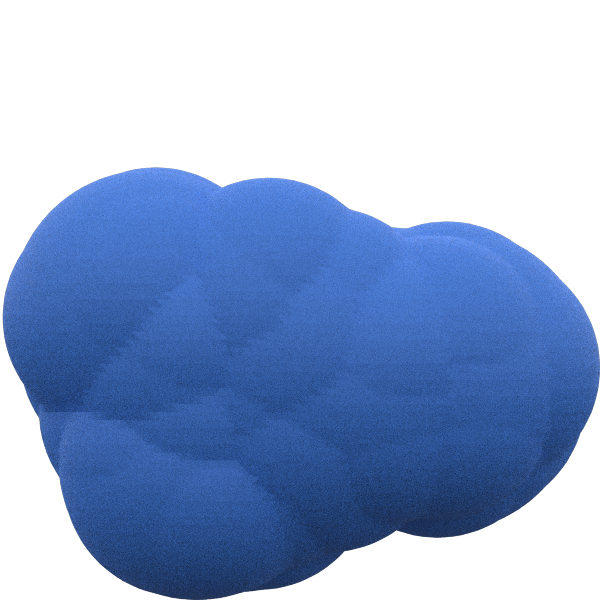

In [237]:
fresnel_mesh(emp2, 1, n_samples=100)

In [283]:
vert, faces, norm, values= measure.marching_cubes_lewiner(emp2, 1)
#vert, norm, faces = march(emp2, 0)
print(np.min(vert), np.max(vert))
f = open('test.obj', 'w')
f.write('#this is a comment\n')
f.write('o test.obj\n')
for v in vert:
    f.write('v '+str(v[0])+' '+str(v[1])+' '+str(v[2])+'\n')
    
for v in norm:
    f.write('vn '+str(v[0])+' '+str(v[1])+' '+str(v[2])+'\n')
for v in faces:
    f.write('f '+str(v[0])+' '+str(v[1])+' '+str(v[2])+'\n')
f.close()

1.6828121 76.13868


In [400]:

####The Ilasik library approach:

vert, norm, faces = march(emp2, 8)



kd = cKDTree(vert[faces].mean(1))


j,k = kd.query(vert[faces].mean(1), k=6)
j=j[:,1]
k = k[:,1:]
g,h=(k+1).nonzero()

from scipy import sparse
#((data, (row_ind, col_ind)), [shape=(M, N)])
mat = sparse.csr_matrix( (np.ones(len(g)).astype(int), (g, k.flatten())), shape=(k.shape[0], k.shape[0]))


import networkx as nx
G = nx.from_scipy_sparse_matrix(mat)
conn = [i for i in nx.connected_components(G)]

In [401]:
##This works for networkx graph connected components, i.e. from ilasik version:
pos = vert[faces[np.array(list(conn[1]))]].reshape(-1,3)

In [279]:
###This works for skimage vertices and faces:
##find all the vertices that are within x of an atom.
facemask = np.any(cdist(vert[faces].mean(1), (atom_centres+buffer)/grid_spacing)<radii*3,1)
pos = vert[faces[facemask]].reshape(-1,3)

In [406]:
def _generate_matrix_XZY(cs, ss):
    c1, c2, c3= cs
    s1, s2, s3 =ss
    return np.asarray(
        [[  c2*c3            , -s2               ,  c2*s3            ],
         [  s1*s3 + c1*c3*s2 ,  c1*c2            ,  c1*s2*s3 - c3*s1 ],
         [  c3*s1*s2 - c1*s3 ,  c2*s1            ,  c1*c3 + s1*s2*s3 ]])

angles = np.array([np.pi*np.random.uniform(0,5), np.pi*np.random.uniform(0,5), np.pi*np.random.uniform(0,5)])
cs = np.cos(angles)
ss = np.sin(angles)
rotmat=_generate_matrix_XZY(cs, ss)

In [407]:
newpos = np.dot(pos, rotmat)
newpos = newpos-np.min(newpos,0)

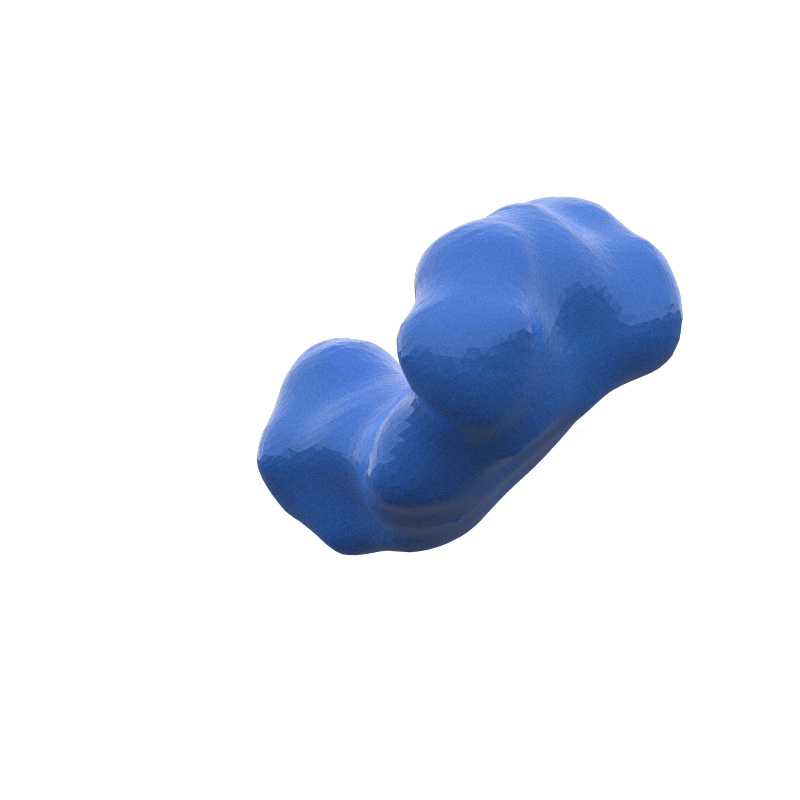

In [408]:
scene1 = fresnel.Scene()
geom = fresnel.geometry.Mesh(scene1,vertices=newpos,N=1)
geom.material = fresnel.material.Material(color=fresnel.color.linear([0.25,0.5,0.9]), 
                                          roughness=0.2,
                                         specular=0.5,
                                         metal=0.1)
#geom.material.specular = 0.5

scene1.camera = fresnel.camera.fit(scene1,view='isometric', margin=0)
scene1.lights = fresnel.light.cloudy()
fresnel.pathtrace(scene1, samples=200, h=800, w=800)

In [405]:
plotly_scatter([(np.dot(pos,rotmat)).reshape(-1,3)], [2])

# Make a grid:

In [365]:
#Make the grid:
grid_size = grid_size + int((2*buffer)/grid_spacing)
grid = np.zeros([grid_size, grid_size, grid_size])

# Make some randomly-placed atoms:
Remember - atoms are expanded by the size of the probe radius! They are actually smaller. 

In [366]:
#make random atom centres:
n_atoms= 55
atom_centres = np.random.uniform(0,20,(n_atoms,3))
#atom_centres = thc_positions.copy()


all_expanded_atoms = list()
#for at, atom_and_probeVol in zip(atom_centres, atom_and_probeVols):
for at in atom_centres:
    stamp = carbon+at
    for st in stamp:
        all_expanded_atoms.append(st)

all_expanded_atoms = np.array(all_expanded_atoms)
#plotly_scatter([all_expanded_atoms], [2])

# Fill in the actual grid values

In [367]:
#Fill in the grid:

#For actual molecules:
#for at, atom_and_probeVol in zip(atom_centres, atom_and_probeVols):

#for testing:
for at in atom_centres:
    stamp = carbon+at+buffer #position of this atom (with buffer included)
    ijk = np.rint(stamp/grid_spacing).astype(int) #as grid points.
    grid[ijk[:,0], ijk[:,1],ijk[:,2]]=1 #set this grid value to 1.

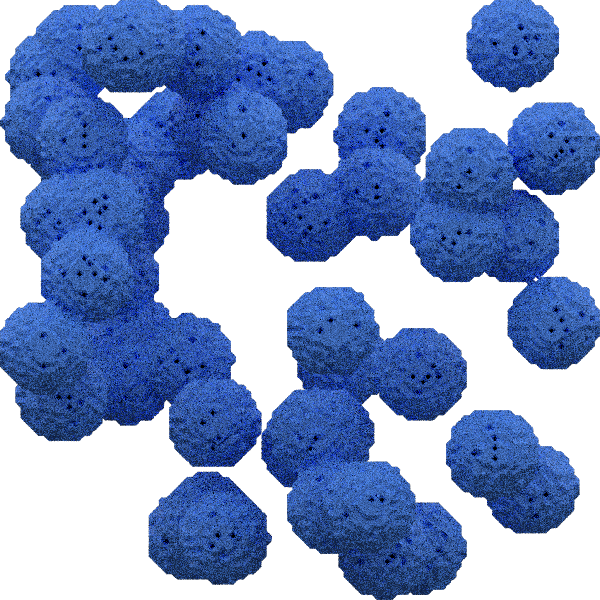

In [368]:
fresnel_mesh(grid, 0.5)

In [361]:
plotly_scatter([np.vstack(grid.nonzero()).T],[2])

# Now generate (evenly-spaced) surface points around the expanded atoms 

In [362]:
#Remove extra radius.

surface_points = golden_spiral(150, atomradius+proberadius)

#for actual molecule:
#surface_points = [golden_spiral(150)*(atomradius+proberadius) for atomradius in radii]

# and for each of those surface points:
- Remove any that are within the expanded radius of another atom. 
- Fill the volume of the remaining surface points with a probe
- Set all underlying grid values to 0. 

In [363]:
orig_grid = grid.copy()

probe_positions = list()

#for actual molecules:
#for at, surface_point in zip(atom_centres, surface_points):
#for testing:
for at in atom_centres:    
    centre = at+buffer
    surface_stamps = surface_points+centre
    distances = cdist(surface_stamps, atom_centres+buffer).min(1)
    #remove the overlapping surface points:
    surface_stamps = surface_stamps[distances>(atomradius+proberadius-0.01)]    
    #now at each surface point, get a probe volume and set underlying grid points to 0. 
    for sst in surface_stamps:
        probe_positions.append(sst)
        stamp = probe+sst
        ijk = np.rint(stamp/grid_spacing).astype(int) #as grid points.
        grid[ijk[:,0], ijk[:,1],ijk[:,2]]=0 #set this grid value to 0.
probe_positions = np.array(probe_positions)

In [99]:
#plotly_scatter([np.array(probe_positions), all_expanded_atoms+buffer], [2, 1])

In [100]:
plotly_scatter([np.vstack(grid.nonzero()).T],[2])

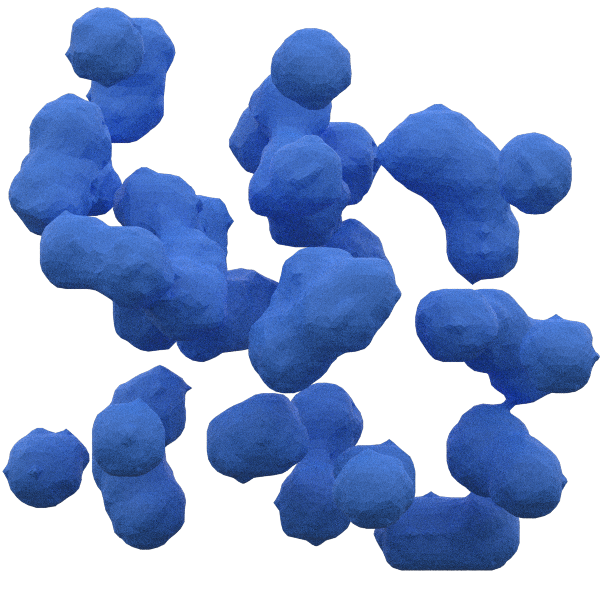

In [105]:
fresnel_mesh(grid, n_samples=100, view='front', smooth=2)